In [1]:
from __future__ import print_function
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## CELEBA Dataset

In [2]:
# Basic setting
dataroot = './data/celeba/img_align_celeba'
batch_size = 128
image_size = 64
nc = 3            #channel number. RGE image is 3, grey scale is 1
nz = 100          # size of input to the generator
ngf = 64          # size of feature maps in generator
ndf = 64          # size of feature maps in discriminator
num_epochs = 5
lr = 0.0002
beta1 = 0.5       # beta1 in Adam optimizer
ngpu = 1

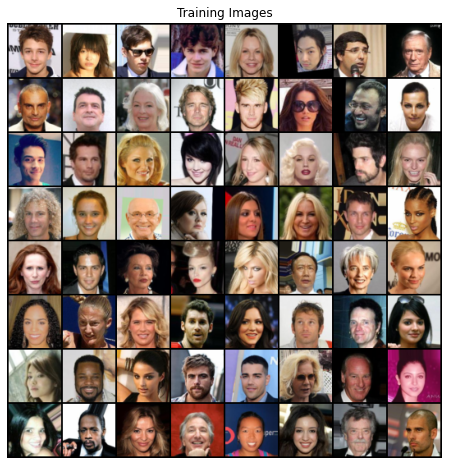

In [3]:
# create the dataset and dataloader
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
# show images in celeba
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
# weights initial function
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input z
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [6]:
netG = Generator(ngpu).to(device)
#  mean=0, stdev=0.2.
netG.apply(weights_init)
# print the Generator
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input size: (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
netD = Discriminator(ngpu).to(device)
#  mean=0, stdev=0.2.
netD.apply(weights_init)
# print Discriminator
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# setting binary cross entropy as our loss function
criterion = nn.BCELoss()
# vectors for visualization of Generator training process
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
real_label = 1
fake_label = 0
# set up Adam as optimizer for netD and netG
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [13]:
# training epoch
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        # use real image to train
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # use latent vectors to train
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # print training process
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # save for loss printing
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # check the results of Generator's output on laten vectors
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.8221	Loss_G: 4.5208	D(x): 0.5080	D(G(z)): 0.5629 / 0.0170
[0/5][50/1583]	Loss_D: 0.2022	Loss_G: 25.0415	D(x): 0.9277	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 1.1171	Loss_G: 13.9409	D(x): 0.9512	D(G(z)): 0.5453 / 0.0000
[0/5][150/1583]	Loss_D: 0.2688	Loss_G: 2.7276	D(x): 0.8986	D(G(z)): 0.1090 / 0.1208
[0/5][200/1583]	Loss_D: 0.9584	Loss_G: 8.3050	D(x): 0.9225	D(G(z)): 0.4755 / 0.0008
[0/5][250/1583]	Loss_D: 0.6460	Loss_G: 5.9214	D(x): 0.9160	D(G(z)): 0.3424 / 0.0057
[0/5][300/1583]	Loss_D: 1.6246	Loss_G: 8.0662	D(x): 0.9587	D(G(z)): 0.7038 / 0.0022
[0/5][350/1583]	Loss_D: 0.5004	Loss_G: 3.5402	D(x): 0.7949	D(G(z)): 0.1918 / 0.0446
[0/5][400/1583]	Loss_D: 0.4316	Loss_G: 4.3467	D(x): 0.8610	D(G(z)): 0.2131 / 0.0232
[0/5][450/1583]	Loss_D: 0.5523	Loss_G: 6.8998	D(x): 0.9134	D(G(z)): 0.3163 / 0.0021
[0/5][500/1583]	Loss_D: 0.3816	Loss_G: 4.1542	D(x): 0.8920	D(G(z)): 0.1932 / 0.0278
[0/5][550/1583]	Loss_D: 0.6573	Loss_G: 6.8807	D(x):

[3/5][50/1583]	Loss_D: 0.8532	Loss_G: 1.4000	D(x): 0.5062	D(G(z)): 0.0629 / 0.3112
[3/5][100/1583]	Loss_D: 0.5624	Loss_G: 1.8349	D(x): 0.7007	D(G(z)): 0.1489 / 0.1987
[3/5][150/1583]	Loss_D: 1.1142	Loss_G: 5.6082	D(x): 0.9060	D(G(z)): 0.5837 / 0.0060
[3/5][200/1583]	Loss_D: 1.0190	Loss_G: 0.8335	D(x): 0.4631	D(G(z)): 0.1209 / 0.4788
[3/5][250/1583]	Loss_D: 0.6954	Loss_G: 2.1474	D(x): 0.6123	D(G(z)): 0.1105 / 0.1545
[3/5][300/1583]	Loss_D: 0.5660	Loss_G: 2.2067	D(x): 0.7477	D(G(z)): 0.2039 / 0.1427
[3/5][350/1583]	Loss_D: 0.7240	Loss_G: 2.1791	D(x): 0.6375	D(G(z)): 0.1744 / 0.1480
[3/5][400/1583]	Loss_D: 1.3070	Loss_G: 0.7660	D(x): 0.3548	D(G(z)): 0.0302 / 0.5224
[3/5][450/1583]	Loss_D: 0.9674	Loss_G: 3.1769	D(x): 0.9001	D(G(z)): 0.5065 / 0.0632
[3/5][500/1583]	Loss_D: 0.5808	Loss_G: 1.8637	D(x): 0.6569	D(G(z)): 0.0955 / 0.2035
[3/5][550/1583]	Loss_D: 0.9565	Loss_G: 1.8261	D(x): 0.5701	D(G(z)): 0.2150 / 0.2233
[3/5][600/1583]	Loss_D: 0.9961	Loss_G: 1.2426	D(x): 0.5152	D(G(z)): 0.1934 / 

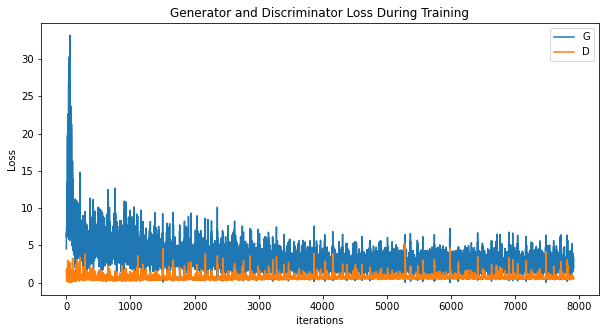

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

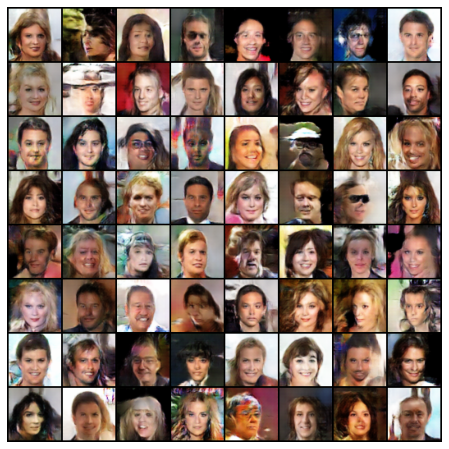

In [18]:
# showing how Generator is doing on latent vectors
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

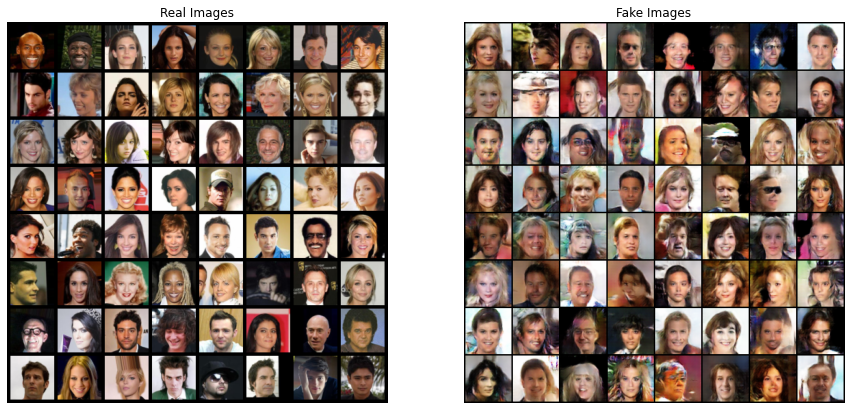

In [16]:
real_batch = next(iter(dataloader))
# real image
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))
# fake image
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

## FER2013 Dataset

In [41]:
# Basic setting
dataroot_fer = './data/fer2013/archive/train'
batch_size = 128
image_size = 48
nc = 1            #channel number. RGE image is 3, grey scale is 1
nz = 100          # size of input to the generator
ngf = 48          # size of feature maps in generator
ndf = 48          # size of feature maps in discriminator
num_epochs = 5
lr = 0.0002
beta1 = 0.5       # beta1 in Adam optimizer
ngpu = 1

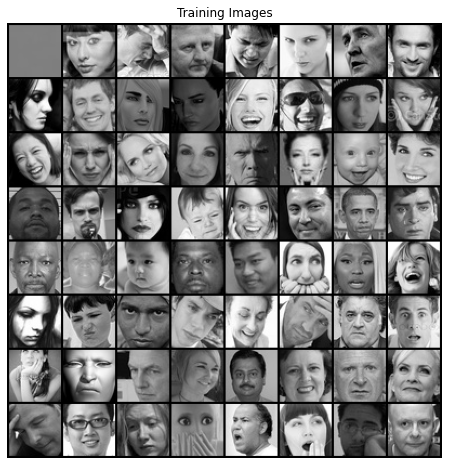

In [48]:
# create the dataset and dataloader
dataset = dset.ImageFolder(root=dataroot_fer,
                           transform=transforms.Compose([
                               transforms.Grayscale(num_output_channels=1),
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))
                           ]))
dataloader_fer = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
# show images in fer2013
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [20]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input z
            nn.ConvTranspose2d( nz, ngf * 8, 3, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # (ngf*8) x 3 x 3
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # (ngf*4) x 6 x 6
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # (ngf*2) x 12 x 12
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # (ngf) x 24 x 24
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # (nc) x 48 x 48
        )

    def forward(self, input):
        return self.main(input)

In [21]:
netG_fer = Generator(ngpu).to(device)
#  mean=0, stdev=0.2.
netG_fer.apply(weights_init)
# print the Generator
print(netG_fer)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 384, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (1): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(384, 192, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(192, 96, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(96, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(48, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [22]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input size: (nc) x 48 x 48
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf) x 24 x 24
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*2) x 12 x 12
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*4) x 6 x 6
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # (ndf*8) x 3 x 3
            nn.Conv2d(ndf * 8, 1, 3, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [23]:
netD_fer = Discriminator(ngpu).to(device)
#  mean=0, stdev=0.2.
netD_fer.apply(weights_init)
# print Discriminator
print(netD_fer)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(48, 96, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(96, 192, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(192, 384, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(384, 1, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [53]:
fixed_noise = torch.randn(48, nz, 1, 1, device=device)
optimizerD = optim.Adam(netD_fer.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG_fer.parameters(), lr=lr, betas=(beta1, 0.999))

In [54]:
# training epoch
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader_fer, 0):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        # use real image to train
        netD_fer.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = netD_fer(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # use latent vectors to train
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG_fer(noise)
        label.fill_(fake_label)
        output = netD_fer(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG_fer.zero_grad()
        label.fill_(real_label)
        output = netD_fer(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # print training process
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # save for loss printing
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # check the results of Generator's output on laten vectors
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG_fer(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/225]	Loss_D: 0.5362	Loss_G: 7.1463	D(x): 0.9390	D(G(z)): 0.3240 / 0.0028
[0/5][50/225]	Loss_D: 0.4176	Loss_G: 6.0086	D(x): 0.8908	D(G(z)): 0.1952 / 0.0063
[0/5][100/225]	Loss_D: 0.3773	Loss_G: 4.9388	D(x): 0.8511	D(G(z)): 0.1325 / 0.0175
[0/5][150/225]	Loss_D: 0.4342	Loss_G: 4.7937	D(x): 0.7413	D(G(z)): 0.0346 / 0.0225
[0/5][200/225]	Loss_D: 0.2952	Loss_G: 4.9585	D(x): 0.8505	D(G(z)): 0.0698 / 0.0177
[1/5][0/225]	Loss_D: 0.3228	Loss_G: 6.4659	D(x): 0.9601	D(G(z)): 0.1892 / 0.0047
[1/5][50/225]	Loss_D: 0.4118	Loss_G: 5.1183	D(x): 0.8760	D(G(z)): 0.1877 / 0.0183
[1/5][100/225]	Loss_D: 0.2858	Loss_G: 5.8025	D(x): 0.9231	D(G(z)): 0.1622 / 0.0057
[1/5][150/225]	Loss_D: 0.5719	Loss_G: 4.7279	D(x): 0.8412	D(G(z)): 0.2451 / 0.0209
[1/5][200/225]	Loss_D: 0.3987	Loss_G: 4.7222	D(x): 0.8842	D(G(z)): 0.1810 / 0.0224
[2/5][0/225]	Loss_D: 0.2792	Loss_G: 3.1919	D(x): 0.8751	D(G(z)): 0.1032 / 0.0841
[2/5][50/225]	Loss_D: 0.3319	Loss_G: 4.9591	D(x): 0.8644	D(G(z)): 0.1

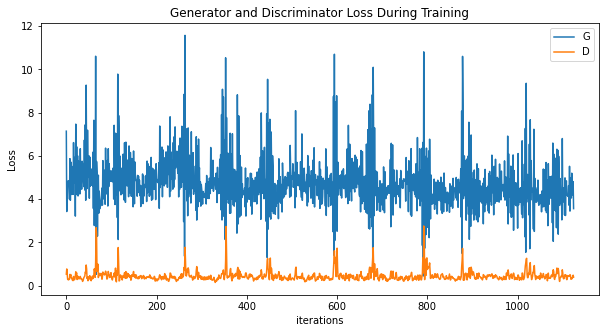

In [55]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

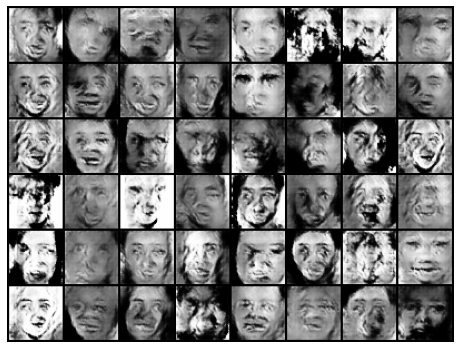

In [56]:
# showing how Generator is doing on latent vectors
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

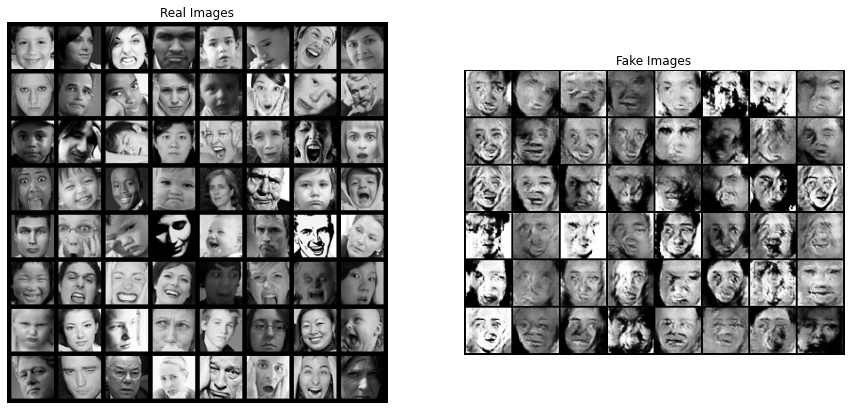

In [57]:
real_batch = next(iter(dataloader))
# real image
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))
# fake image
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()